In [3]:
[#SciPy で Parks-McClellan 最適 FIR フィルタ](https://org-technology.com/posts/Parks-McClellan-algorithm.html)

https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.remez.html
https://gsmcustomeffects.hatenablog.com/entry/2019/01/16/225309


SyntaxError: invalid syntax (<ipython-input-3-4dd66096e5ef>, line 3)

In [ ]:
#------------------------------
# include library
#------------------------------

import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal

In [ ]:
#------------------------------
# function
#------------------------------

def plot_response(fs, w, h, title):
    '''周波数特性を表示する関数
    Args:
        fs(int): 
        w (int): 
        h (int): 
        title(str): 
    Returns:
    '''
    # Figureインスタンス生成し、画像領域を確保
    fig = plt.figure()
    # グラフの枠を追加
    ax = fig.add_subplot(111)
    # グラフにデータをプロット
    ax.plot( 0.5 * fs * w /np.pi, 20 * np.log10( np.abs(h) ) )
    ax.set_ylim( -4, 5 )
    ax.set_xlim( 0, cutoff )
    ax.grid(True)
    ax.set_xlabel('Frequency (Hz) ')
    ax.set_ylabel('Gain (dB) ')
    ax.set_title(title)

In [ ]:
#------------------------------
# FIR filter parameter
#------------------------------

# Sampling rate
fs = 1000000.0
# Cut-off Frequency
cutoff = 13800.0
# Witdh of transition from pass band to stop band, Hz
trans_width = 200
# Size of FIR filter
numtaps = 35

#------------------------------
# A/D signal parameter
#------------------------------

# A/D分解能
reso = 18
# 測定信号の周波数
f = 102000
# ノイズ振幅
noise = 0.0
# オーバーサンプリング
over_rate = 4

# サンプリング数
n = 2 ** reso
# サンプリング周期
dt = 1/ fs
# ナイキスト周波数
fn = 1/(2 * dt)


In [ ]:
# TODO: remezは何か調査
# taps = signal.remez(numtaps, [0, cutoff, cutoff + trans_width, 0.5*fs], [1, 0], Hz=fs)
# デジタルフィルターの係数を与えてその応答を，複素振幅で求める．
# w : 周波数点 0 ~ pi ラジアン/サンプル単位
# h : 周波数点における複素周波数応答
# w, h = signal.freqz(taps, [1], worN=2000)

b = signal.firwin(numtaps, cutoff/fn)  
w, h = signal.freqz(b)

plot_response(fs, w, h, "FIR filter")


In [8]:
# 時間
t = np.linspace(1, n, n)*dt-dt

y = np.sin(2*np.pi*f*t)+ noise *np.random.randn(t.size)
#y = np.sin(2*np.pi*f*t)+ noise *np.random.randn(t.size)

#------------------------------
# 測定信号
#------------------------------
y2 = np.linspace(0,n,n)
index = 0 


for i in range(y.size):
    if ( i == 0 ):
        y2[i] = y[0]
    elif ( ( i % over_rate ) == 0 ):
        index = index + 1
        y2[i] = y[ index - 1 ]
    else:
        y2[i] = 0

#------------------------------





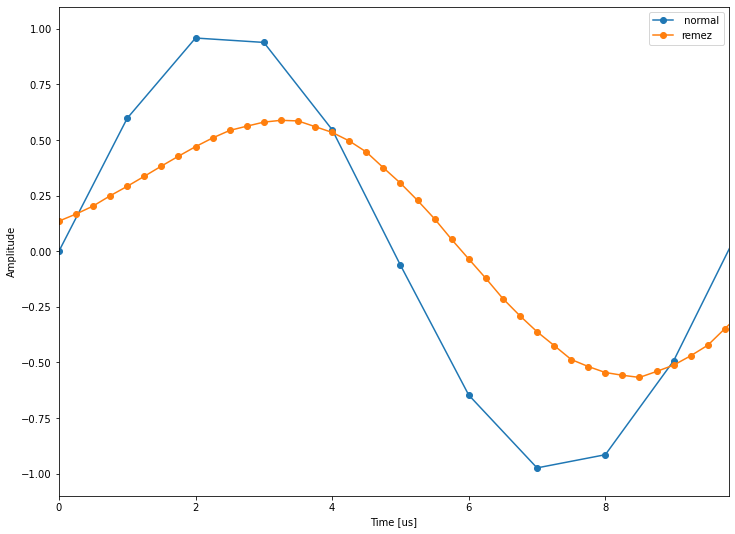

In [9]:

filtered = signal.lfilter(b, 1.0, y2)
delay = (numtaps-1)/2*dt

plt.figure(figsize=(12,9))
plt.plot(t*1000000, y,'-o',label=" normal")
plt.plot((t-delay)/over_rate*1000000, filtered*over_rate, '-o',label="remez")
plt.xlim(0, 1/f*1000000)
plt.legend(loc="upper right")
plt.xlabel("Time [us]")
plt.ylabel("Amplitude")
plt.show()

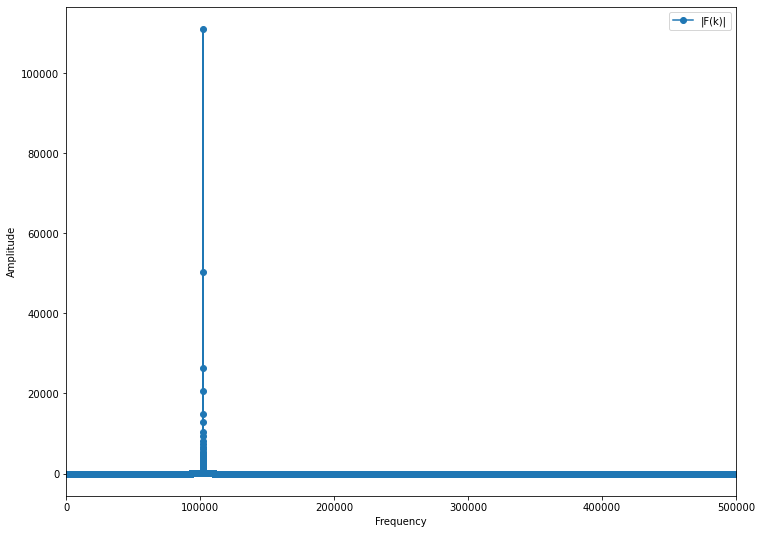

In [10]:
 # 周波数軸
freq = np.linspace(0, 1.0/dt, n)

# 高速フーリエ変換
F = np.fft.fft(y)

# 振幅スペクトルを計算
Amp = np.abs(F)

plt.figure(figsize=(12,9))
plt.plot(freq, np.abs(F),'-o',label="|F(k)|")
plt.legend(loc="upper right")
plt.xlim(0, fs/2)

plt.xlabel("Frequency")
plt.ylabel("Amplitude")
plt.show()

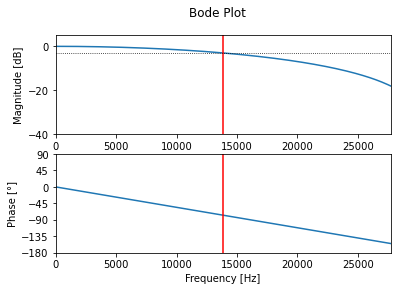

In [15]:
from scipy.optimize import newton
from scipy.signal import freqz, dimpulse, dstep
from math import sin, cos, sqrt, pi
import numpy as np
import matplotlib.pyplot as plt

#------------------


# Function for calculating the cut-off frequency of a moving average filter
def get_sma_cutoff(N, **kwargs):
    func = lambda w: sin(N*w/2) - N/sqrt(2) * sin(w/2)  # |H(e^jω)| = √2/2
    deriv = lambda w: cos(N*w/2) * N/2 - N/sqrt(2) * cos(w/2) / 2  # dfunc/dx
    omega_0 = pi/N  # Starting condition: halfway the first period of sin(Nω/2)
    return newton(func, omega_0, deriv, **kwargs)

# Simple moving average design parameters
f_s = 1000000
N = 32

# Find the cut-off frequency of the SMA
w_c = get_sma_cutoff(N)
f_c = w_c * f_s / (2 * pi)

# SMA coefficients
b = np.ones(N)
a = np.array([N] + [0]*(N-1))

# Calculate the frequency response
w, h = freqz(b, a, worN=4096)
w *= f_s / (2 * pi)                      # Convert from rad/sample to Hz

# Plot the amplitude response
plt.subplot(2, 1, 1)
plt.suptitle('Bode Plot')
plt.plot(w, 20 * np.log10(abs(h)))       # Convert modulus to dB
plt.ylabel('Magnitude [dB]')
plt.xlim(0, 2*f_c)
plt.ylim(-40, 5)
plt.axvline(f_c, color='red')
plt.axhline(-3.01, linewidth=0.8, color='black', linestyle=':')


# Plot the phase response
plt.subplot(2, 1, 2)
plt.plot(w, 180 * np.angle(h) / pi)      # Convert argument to degrees
plt.xlabel('Frequency [Hz]')
plt.ylabel('Phase [°]')
plt.xlim(0, 2*f_c)
plt.ylim(-180, 90)
plt.yticks([-180, -135, -90, -45, 0, 45, 90])
plt.axvline(f_c, color='red')
plt.show()


Text(0.5, 0, 'time (s) ')

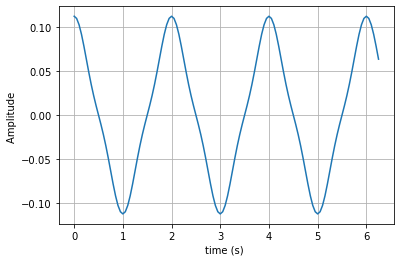

In [47]:
#------------------------------
# include library
#------------------------------
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal


#------------------------------
# 測定信号
#------------------------------
f =1
t = np.arange(0, 2 *np.pi ,0.05)

y = 1/ np.pi **2 * np.cos( np.pi * t)

# for n in range( 2, 1 ):
     y += 1 / ( ( 2 * n - 1 )**2 * np.pi**2 ) * np.cos( ( 2 * n - 1 )  * np.pi * t ) 
n = 2

y += 1 / ( ( 2 * n - 1 ) * np.pi )**2 * np.cos( ( 2 * n - 1 )  * np.pi * t ) 

#y = 1/ np.pi **2 * np.cos( np.pi * t) + 1/ ( 3 * np.pi) **2 * np.cos( 3* np.pi * t)

#------------------------------

# Figureインスタンス生成し、画像領域を確保
fig = plt.figure()
# グラフの枠を追加
ax = fig.add_subplot(111)
# グラフにデータをプロット
ax.plot( t , y)
ax.grid(True)
ax.set_ylabel('Amplitude ')
ax.set_xlabel('time (s) ')
